## Linear Regression with one variable
- Fitting a straight line to your data.
- This linear regression model is a particular type of supervised learning model. It's callled regression model because it predicts numbers as the output like prices.
- We want to predict the price of a house based on the size of the house. One thing you could do this, we could build a linear regression model from the dataset. The model will fit a straight line to the data.
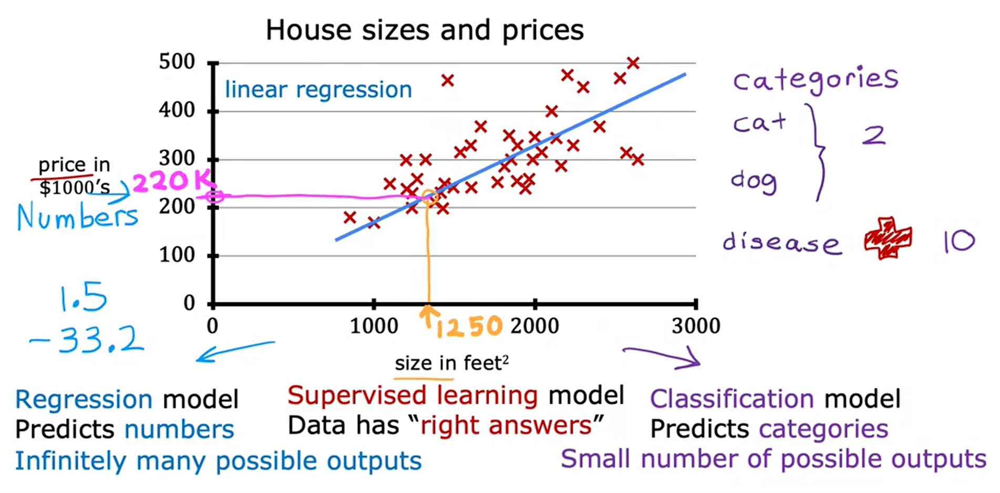
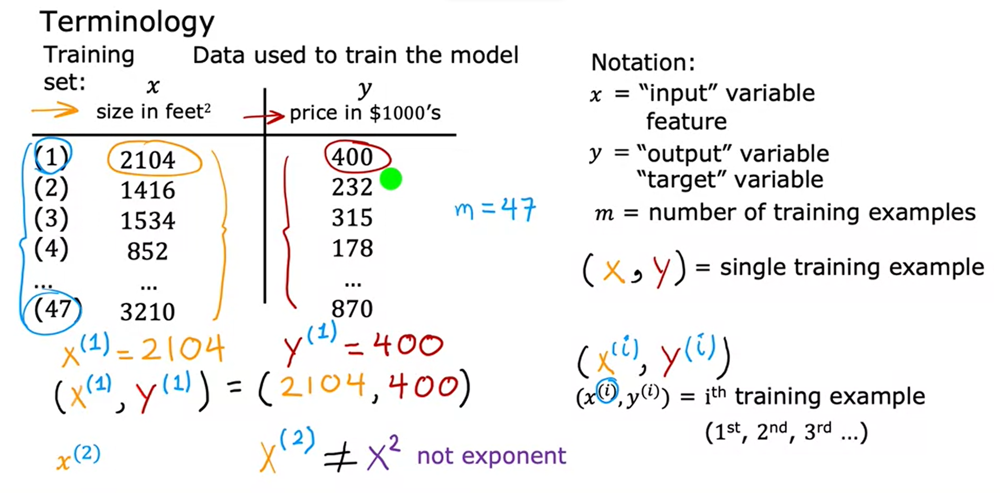

- Training set in supervised learing includes both the input features, such as the size of the house and also the output targets, such as the price of the house.
- The output targets are the right answers to the model we'll learn from.
- To train the model, you feed the training set, both the input features and the output targets to yout learning algorithm. Then your supervised learning algorithm will produce some function. We'll write this function as f.
- This function f used to be called a hypothesis.
- The job with f is to take a new input x and output and estimate or a prediction, which is called y-hat.
- In ML, the convention is that y-hat is the estimate or the prediction for y. The function f is called the model. X is called the input or feature, and the output of the model is the prediction, y-hat
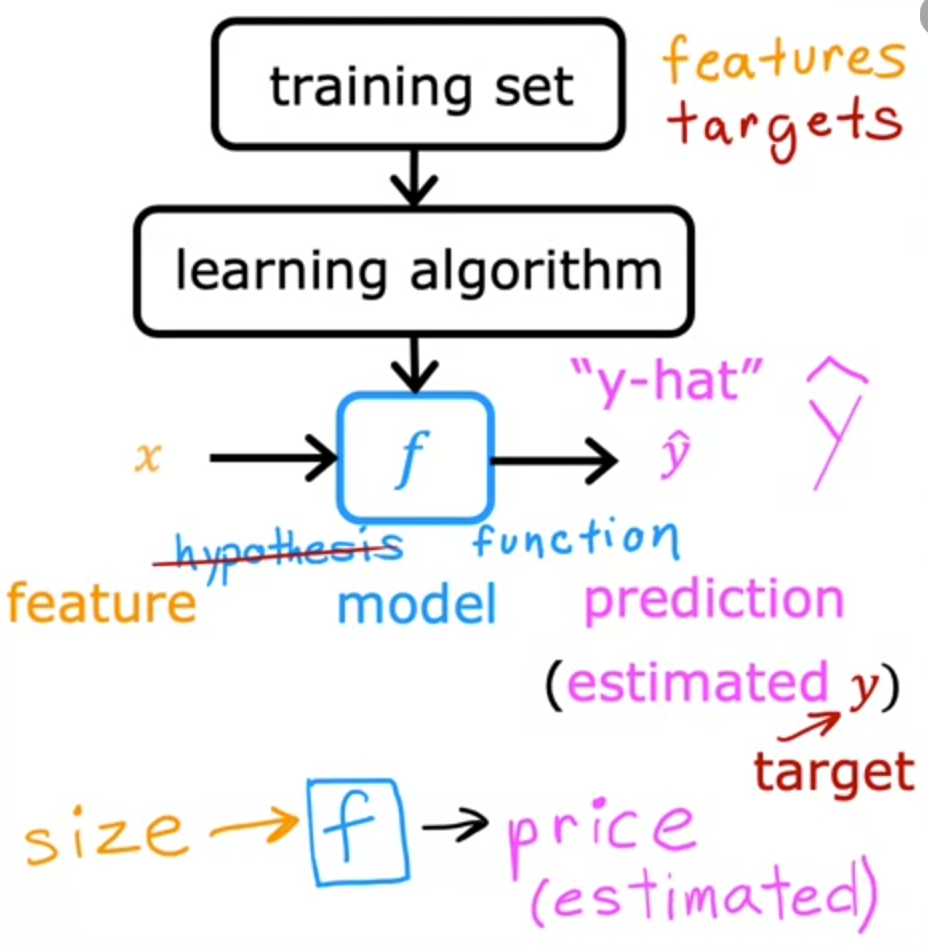
- You're function can e written as f(x) = wx+b
- This is linear regression with one variable, which is also called univariate linear regression.
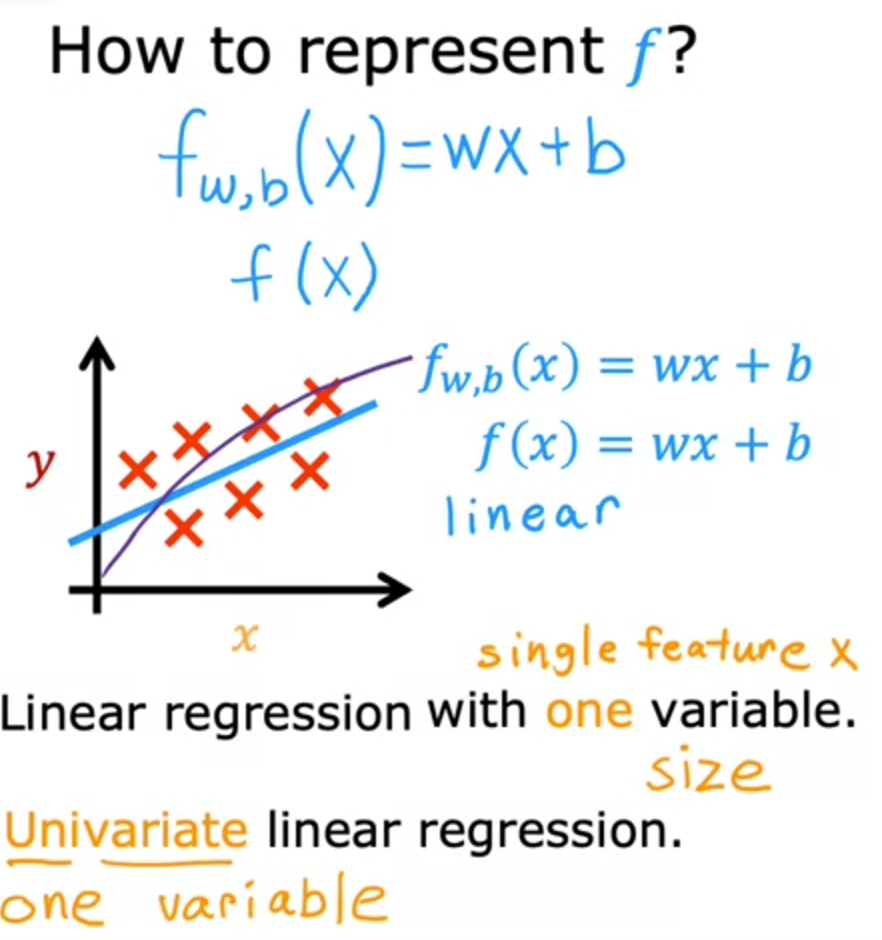

# LAB : Model Representation
- Learn to implement the model f for linear regression with one variable

In [1]:
import numpy as np
import matplotlib.pyplot as plt

- This label will use a simple data set with oly 2 data points
| Size (1000 sqft)     | Price (1000s of dollars) |
| -------------------| ------------------------ |
| 1.0               | 300                      |
| 2.0               | 500                      |

In [2]:
x_train = np.array([1.0, 2.0])
y_train = np.array([300.0, 500.0])
print(f'x_train = {x_train}')
print(f'y_train = {y_train}')

x_train = [1. 2.]
y_train = [300. 500.]


In [3]:
print(f'x_train.shape : {x_train.shape}')
m = x_train.shape[0]
print(f'Number of training examples : {m}')

x_train.shape : (2,)
Number of training examples : 2


In [5]:
m = len(x_train)
print(f'Number of training examples is: {m}')

Number of training examples is: 2


In [7]:
i = 0 # Change this to 1 to see (x^1, y^1)

x_i = x_train[i]
y_i = y_train[i]
print(f"(x^({i}), y^({i})) = ({x_i}, {y_i})")

(x^(0), y^(0)) = (1.0, 300.0)


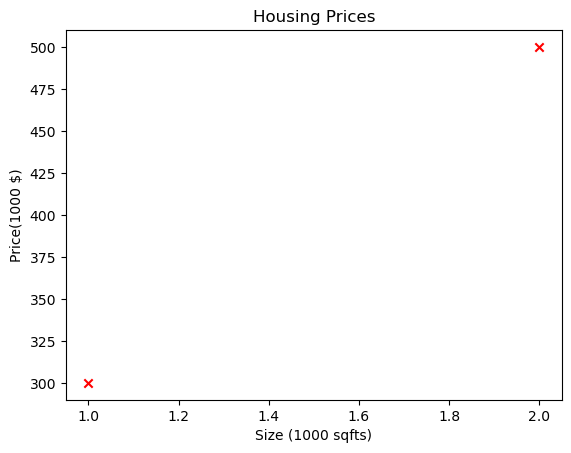

In [8]:
# plot the data points
plt.scatter(x_train, y_train, marker='x', c='r')
plt.title("Housing Prices")
plt.ylabel('Price(1000 $)')
plt.xlabel('Size (1000 sqfts)')
plt.show()

In [10]:
w = 100
b = 100
print(f'w: {w}')
print(f'b: {b}')

w: 100
b: 100


In [12]:
def compute_model_output(x, w, b):
    '''
    Computes the prediction of a linear model
    Args:
      x (ndarray (m,)): Data, m examples 
      w,b (scalar)    : model parameters  
    Returns
      f_wb (ndarray (m,)): model prediction
    '''
    
    m = x.shape[0]
    f_wb = np.zeros(m)
    for i in range(m):
        f_wb[i] = w * x[i] + b
        
    return f_wb

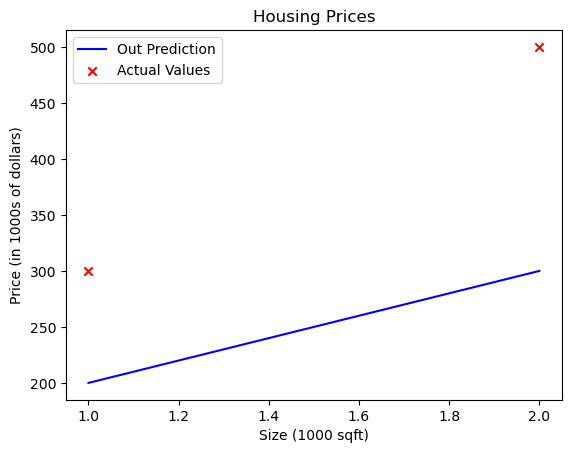

In [13]:
tmp_f_wb = compute_model_output(x_train, w, b)

plt.plot(x_train, tmp_f_wb, c='b', label='Out Prediction')

plt.scatter(x_train, y_train, marker='x', c='r', label='Actual Values')

# Set the title
plt.title("Housing Prices")
# Set the y-axis label
plt.ylabel('Price (in 1000s of dollars)')
# Set the x-axis label
plt.xlabel('Size (1000 sqft)')
plt.legend()
plt.show()

# Cost Function
- The cost function will tell us how well the model is doing so that we can try to get it do better.
- In linear regression, w and b are called the model parameters.
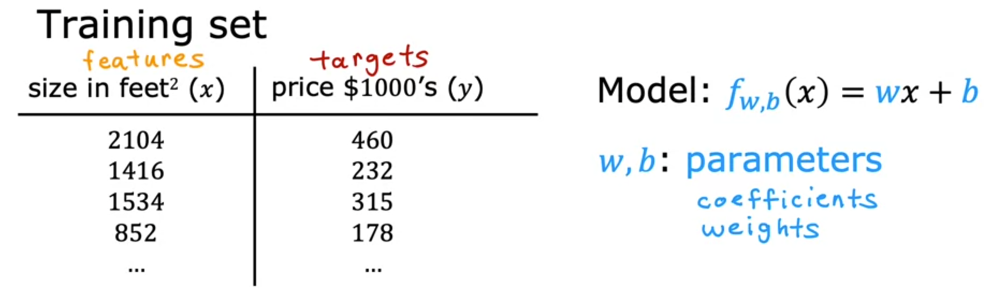
- In ML parameters of the model are the variables you can adjust during training in order to imporce the model.
- Sometime, parameters w and b referred to as coefficients or as weights.
- Depending on the values we've chosen for w and b we get a different function of x, which generates a different line on the graph.
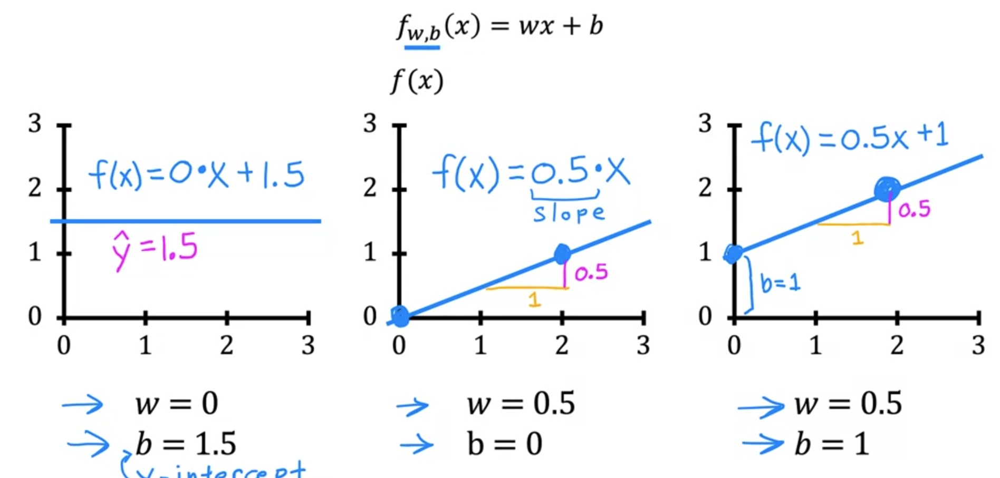
- With linear regression, what we want to do is to choose values for the parameters w and b so that the straight line you get from the function f sometimes fits the data well.
- Cost function looks at how to measure how well a line fits the training data. The cost function takes a predicted y_hat and compares it to the target y by taking y_hat minus y. This difference is called the error, we're measuring how far off to prediction is from the target
- To build a cost function that does'nt get bigger as the training set size gets larger, we will compute the average squared error instead of the total squared error.
- We write J to refer to the cost function.
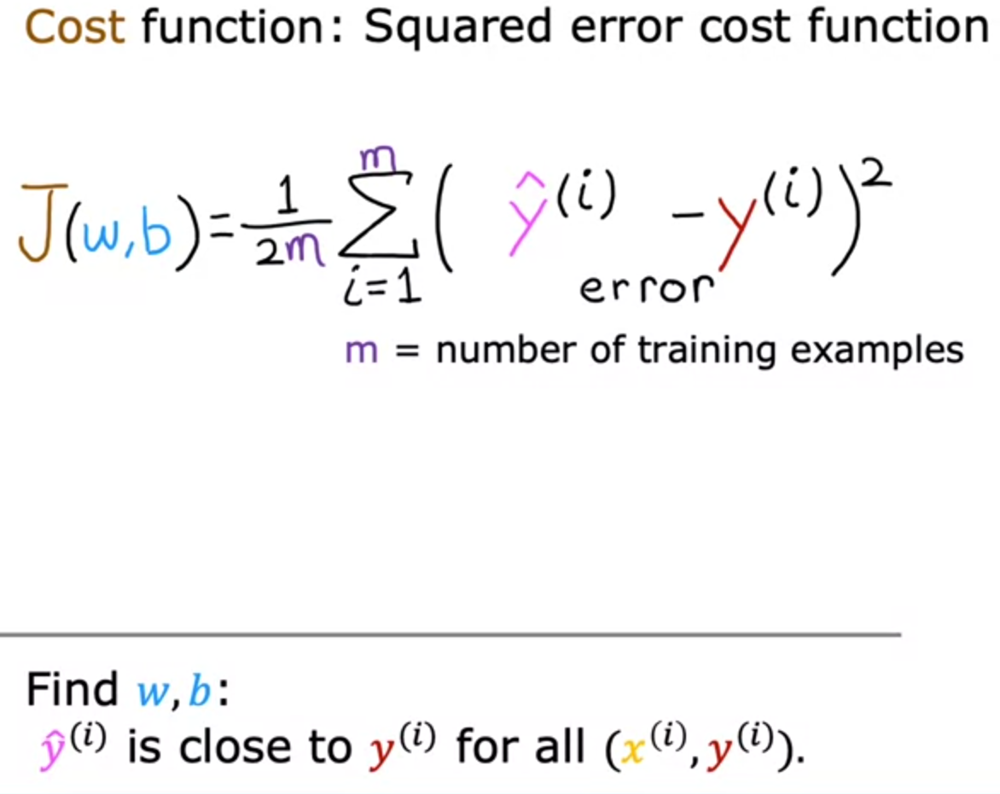
- In ML, different people will use different cost functions for different applications
- The prediction y_hat is equal to the outpus of the model f at x.
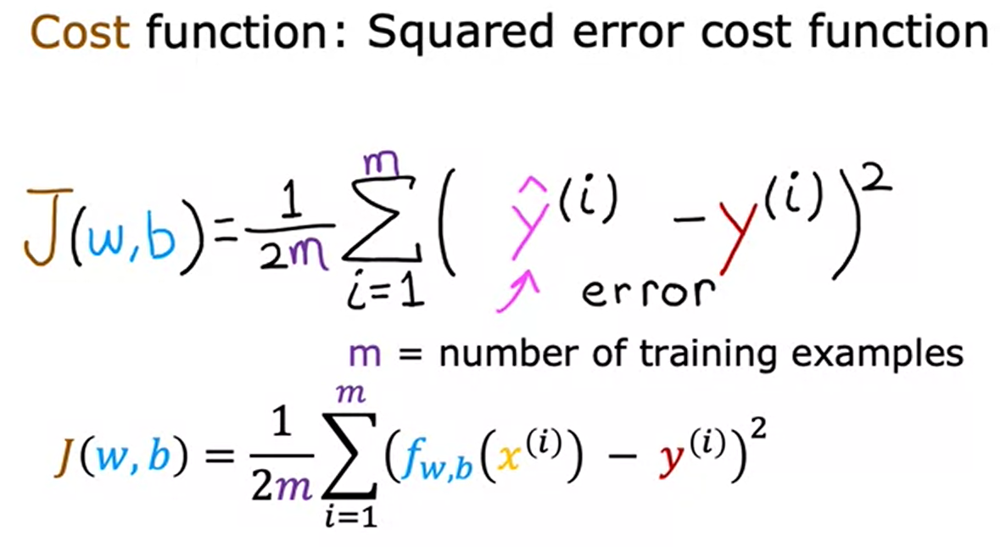
- Eventually, we're going to want to find values of w and b that make the cost function small.

## Cost Function Intuition
- Cost function is used to find the best parameters for the model.
- We need to find the values for w and b, so that the straight line fits the training data well. To measure how well a choice of w and b fits the training data, we have cost function J.
- Cost function J does, measures the difference b/w model's predictions, and the actual true values for y.
- That means regression would try to find the valuees for w and b, then make a J of w e as small as possible. We want to minimize, J as a function of w and b.
- 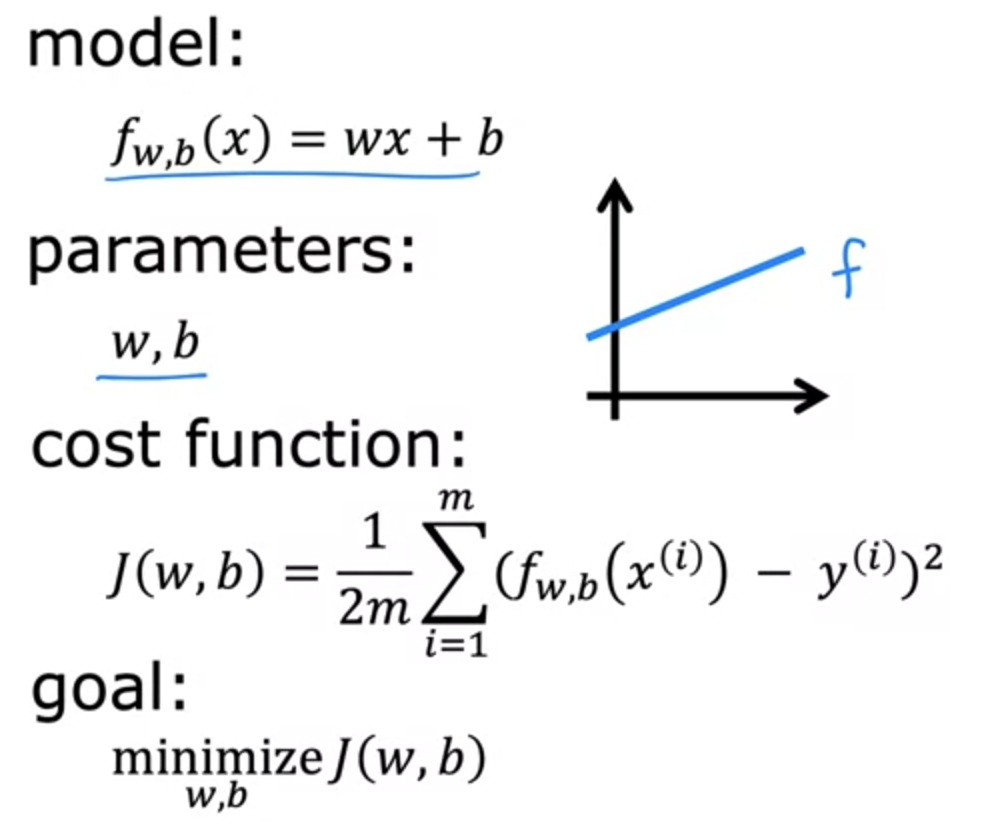
- We temporarily set b to zero to simplify things
1. 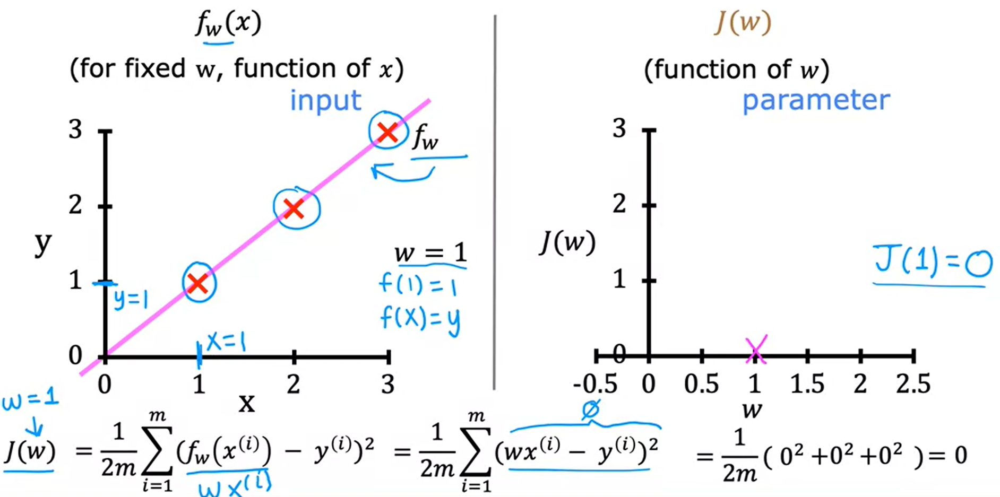
2. 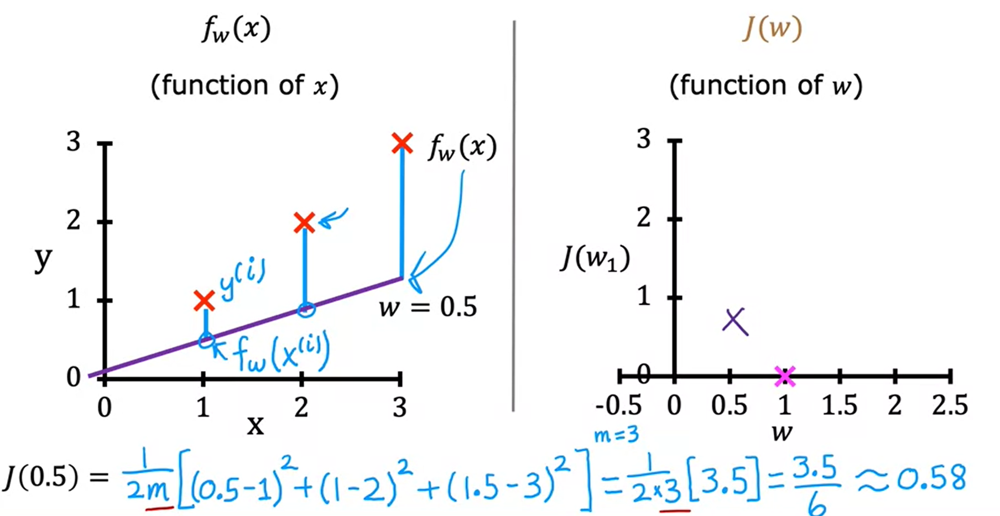
3. 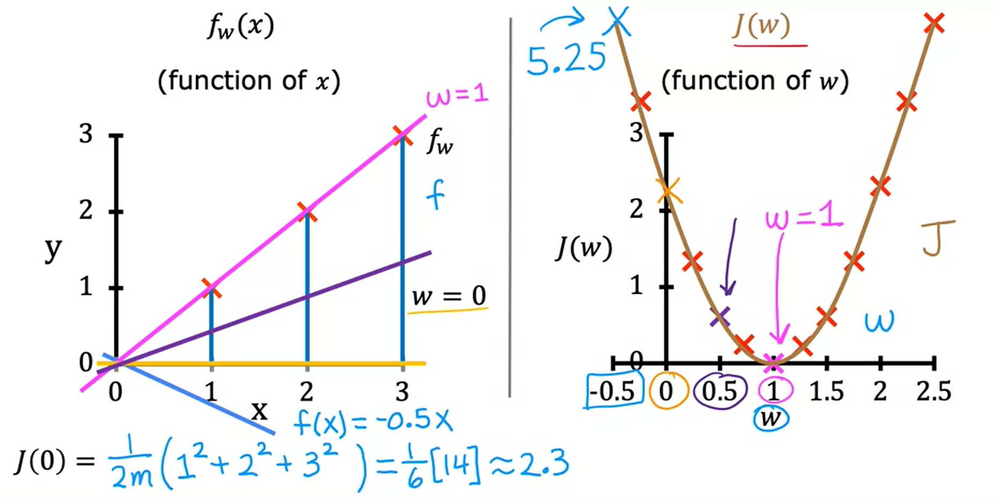
- Choosing a value of w that causes J of w to be as small as possible seems like a good bet.
- J is the cost function that measures how big the squred errors are, so choosing w that minimizes these squared errors, makes them as small as possible, will give us a good model.

## Visualizing the cost function
- We temporarily set b to zero to simplify things, when we had only one parameter, w, the cost function has this U-shaped curve. Now, in housing price example, we have 2 parameters w and b. So the plot becomes little more complex.
- It turns out that the cost function aslo has a similar shape like a soup bowl, in 3 dimensions instead of 2.
- 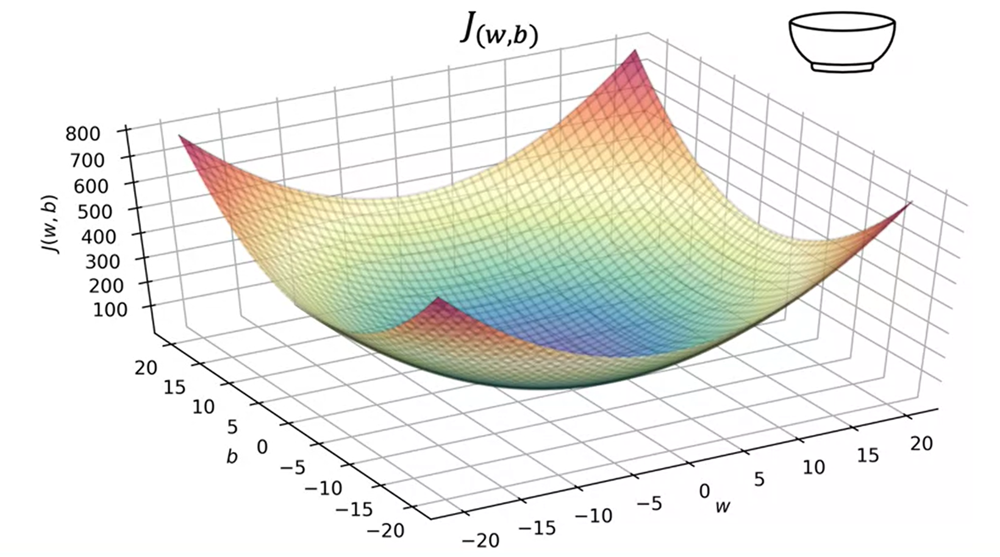

- We want an efficeint algorithm that we can write in code for automatically finding the values of w and b they give you the best fit line, that minimized the cost function J. There is an algorithm for doing this called gradient descent.

# LAB : Cost Function
- Implementing and exploring the cost function for linear regression with one variable.

In [15]:
import numpy as np
import matplotlib.pyplot as plt

In [16]:
x_train = np.array([1.0, 2.0])        
y_train = np.array([300.0, 500.0])   

### Computing cost function
- The cost is a measure how well our model is predicting the target price of house.
The equation for cost with one variable is:
  $$J(w,b) = \frac{1}{2m} \sum\limits_{i = 0}^{m-1} (f_{w,b}(x^{(i)}) - y^{(i)})^2 \tag{1}$$ 
 
where 
  $$f_{w,b}(x^{(i)}) = wx^{(i)} + b \tag{2}$$
  
- $f_{w,b}(x^{(i)})$ is our prediction for example $i$ using parameters $w,b$.  
- $(f_{w,b}(x^{(i)}) -y^{(i)})^2$ is the squared difference between the target value and the prediction.   
- These differences are summed over all the $m$ examples and divided by `2m` to produce the cost, $J(w,b)$.  
>Note, in lecture summation ranges are typically from 1 to m, while code will be from 0 to m-1.

In [17]:
def compute_cost(x, y, w, b):
    '''
    Computes the cost function for linear regression.
    
    Args:
      x (ndarray (m,)): Data, m examples 
      y (ndarray (m,)): target values
      w,b (scalar)    : model parameters  
    
    Returns
        total_cost (float): The cost of using w,b as the parameters for linear regression
               to fit the data points in x and y
    '''
    m = x.shape[0]
    
    cost_sum = 0
    for i in range(m):
        f_wb = w * x[i] + b
        cost = (f_wb - y[i]) **2
        cost_sum = cost_sum + cost
    total_cost = (1/(2*m))*cost_sum
    
    return total_cost

- The goal is to find a model $f_{w,b}(x) = wx + b$, with parameters w, b, which will acurately predict house values given an input x. The cost is a measure of how accurate the model is on the training data.